<a href="https://colab.research.google.com/github/Prabhusabharish/Flight_Customer_Data/blob/main/Flight_customer_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


In [ ]:
flight = pd.read_csv("/content/flight_customer_data.csv")
flight.head()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,...,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,Male,6,.,beijing,CN,31.0,3/31/2014,...,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
1,28065,2/19/2007,8/3/2007,Male,6,NaN,beijing,CN,42.0,3/31/2014,...,167434.0,293678,3/25/2014,7,5.194245,17,29,1.252314,415768,33
2,55106,2/1/2007,8/30/2007,Male,6,.,beijing,CN,40.0,3/31/2014,...,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,Male,5,Los Angeles,CA,US,64.0,3/31/2014,...,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,Male,6,guiyang,guizhou,CN,48.0,3/31/2014,...,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39


In [ ]:
flight.shape

(62988, 23)

In [ ]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MEMBER_NO          62988 non-null  int64  
 1   FFP_DATE           62988 non-null  object 
 2   FIRST_FLIGHT_DATE  62988 non-null  object 
 3   GENDER             62985 non-null  object 
 4   FFP_TIER           62988 non-null  int64  
 5   WORK_CITY          60719 non-null  object 
 6   WORK_PROVINCE      59740 non-null  object 
 7   WORK_COUNTRY       62962 non-null  object 
 8   AGE                62568 non-null  float64
 9   LOAD_TIME          62988 non-null  object 
 10  FLIGHT_COUNT       62988 non-null  int64  
 11  BP_SUM             62988 non-null  int64  
 12  SUM_YR_1           62437 non-null  float64
 13  SUM_YR_2           62850 non-null  float64
 14  SEG_KM_SUM         62988 non-null  int64  
 15  LAST_FLIGHT_DATE   62988 non-null  object 
 16  LAST_TO_END        629

In [ ]:
flight['FFP_DATE']

0        11/2/2006
1        2/19/2007
2         2/1/2007
3        8/22/2008
4        4/10/2009
           ...    
62983    5/20/2011
62984     3/8/2010
62985    3/30/2006
62986     2/6/2013
62987    2/17/2013
Name: FFP_DATE, Length: 62988, dtype: object

In [ ]:
flight_columns = ['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']
flight[flight_columns]

,FFP_DATE,FIRST_FLIGHT_DATE,LOAD_TIME,LAST_FLIGHT_DATE
0,11/2/2006,12/24/2008,3/31/2014,3/31/2014
1,2/19/2007,8/3/2007,3/31/2014,3/25/2014
2,2/1/2007,8/30/2007,3/31/2014,3/21/2014
3,8/22/2008,8/23/2008,3/31/2014,12/26/2013
4,4/10/2009,4/15/2009,3/31/2014,3/27/2014
...,...,...,...,...
62983,5/20/2011,6/5/2013,3/31/2014,6/9/2013
62984,3/8/2010,9/14/2013,3/31/2014,1/3/2014
62985,3/30/2006,12/2/2006,3/31/2014,3/3/2014
62986,2/6/2013,2/14/2013,3/31/2014,2/26/2013


In [ ]:
# Datetime columns change for Unique Format
flight[flight_columns] = flight[flight_columns].apply(pd.to_datetime,errors='coerce')

In [ ]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   MEMBER_NO          62988 non-null  int64         
 1   FFP_DATE           62988 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE  62988 non-null  datetime64[ns]
 3   GENDER             62985 non-null  object        
 4   FFP_TIER           62988 non-null  int64         
 5   WORK_CITY          60719 non-null  object        
 6   WORK_PROVINCE      59740 non-null  object        
 7   WORK_COUNTRY       62962 non-null  object        
 8   AGE                62568 non-null  float64       
 9   LOAD_TIME          62988 non-null  datetime64[ns]
 10  FLIGHT_COUNT       62988 non-null  int64         
 11  BP_SUM             62988 non-null  int64         
 12  SUM_YR_1           62437 non-null  float64       
 13  SUM_YR_2           62850 non-null  float64       
 14  SEG_KM

In [ ]:
flight.isnull().sum()

MEMBER_NO               0
FFP_DATE                0
FIRST_FLIGHT_DATE       0
GENDER                  3
FFP_TIER                0
WORK_CITY            2269
WORK_PROVINCE        3248
WORK_COUNTRY           26
AGE                   420
LOAD_TIME               0
FLIGHT_COUNT            0
BP_SUM                  0
SUM_YR_1              551
SUM_YR_2              138
SEG_KM_SUM              0
LAST_FLIGHT_DATE      421
LAST_TO_END             0
AVG_INTERVAL            0
MAX_INTERVAL            0
EXCHANGE_COUNT          0
avg_discount            0
Points_Sum              0
Point_NotFlight         0
dtype: int64

In [ ]:
flight.columns

Index(['MEMBER_NO', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'GENDER', 'FFP_TIER',
       'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'AGE', 'LOAD_TIME',
       'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM',
       'LAST_FLIGHT_DATE', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight'],
      dtype='object')

In [ ]:
flight_plot = flight[['AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SEG_KM_SUM', 'MAX_INTERVAL', 'avg_discount', 'AVG_INTERVAL']]

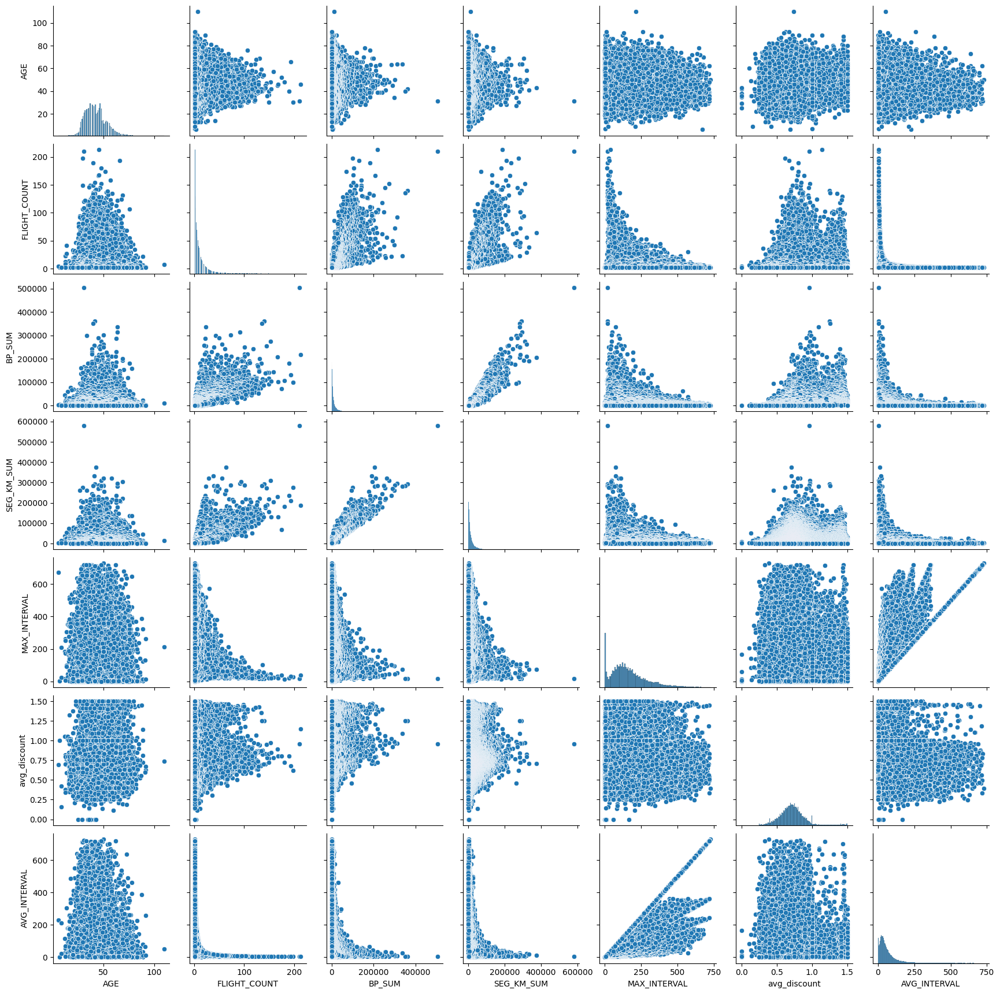

In [ ]:
# Cluster
sns.pairplot(flight_plot)
plt.show()

In [ ]:
# Empty %
percentage = (flight.isnull().mean()*100).round(2)
percentage

MEMBER_NO            0.00
FFP_DATE             0.00
FIRST_FLIGHT_DATE    0.00
GENDER               0.00
FFP_TIER             0.00
WORK_CITY            3.60
WORK_PROVINCE        5.16
WORK_COUNTRY         0.04
AGE                  0.67
LOAD_TIME            0.00
FLIGHT_COUNT         0.00
BP_SUM               0.00
SUM_YR_1             0.87
SUM_YR_2             0.22
SEG_KM_SUM           0.00
LAST_FLIGHT_DATE     0.67
LAST_TO_END          0.00
AVG_INTERVAL         0.00
MAX_INTERVAL         0.00
EXCHANGE_COUNT       0.00
avg_discount         0.00
Points_Sum           0.00
Point_NotFlight      0.00
dtype: float64

In [ ]:
pd.DataFrame({
    "Columns" : percentage.index,
    "empty" : percentage.values
}).sort_values('empty', ascending=False)

,Columns,empty
6,WORK_PROVINCE,5.16
5,WORK_CITY,3.60
12,SUM_YR_1,0.87
15,LAST_FLIGHT_DATE,0.67
8,AGE,0.67
13,SUM_YR_2,0.22
7,WORK_COUNTRY,0.04
0,MEMBER_NO,0.00
21,Points_Sum,0.00
20,avg_discount,0.00


In [ ]:
flight['AGE']

In [ ]:
flight["AGE"] = flight["AGE"].fillna(flight["AGE"].mean())

In [ ]:
flight = flight.dropna()

In [ ]:
flight.shape

(58178, 23)

In [ ]:
flight_before_scaling = flight.copy()

In [ ]:
flight.shape

(58178, 23)

In [ ]:
flight.select_dtypes(include=['float64', 'int64'])

,MEMBER_NO,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,6,31.0,210,505308,239560.0,234188.0,580717,1,3.483254,18,34,0.961639,619760,50
2,55106,6,40.0,135,351159,163618.0,164982.0,283712,11,5.298507,18,20,1.254676,406361,26
3,21189,5,64.0,23,337314,116350.0,125500.0,281336,97,27.863636,73,11,1.090870,372204,12
4,39546,6,48.0,152,273844,124560.0,130702.0,309928,5,4.788079,47,27,0.970658,338813,39
5,56972,6,64.0,92,313338,112364.0,76946.0,294585,79,7.043956,52,10,0.967692,343121,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62982,16415,4,35.0,2,0,0.0,0.0,3848,437,0.000000,0,0,0.000000,0,0
62983,18375,4,25.0,2,0,0.0,0.0,1134,297,4.000000,4,1,0.000000,12318,22
62984,36041,4,38.0,4,0,0.0,0.0,8016,89,37.000000,60,14,0.000000,106972,43
62985,45690,4,43.0,2,0,0.0,0.0,2594,29,166.000000,166,0,0.000000,0,0


In [ ]:
flight_for_scal = flight.select_dtypes(include=['float64', 'int64'])
scl_columns = flight_for_scal.columns

In [ ]:
scl_columns

Index(['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1',
       'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight'],
      dtype='object')

In [ ]:
std_sc = StandardScaler()
flight[scl_columns] = std_sc.fit_transform(flight[scl_columns])

In [ ]:
flight.head()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,...,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,1.290098,2006-11-02,2008-12-24,Male,5.011337,.,beijing,CN,-1.153853,2014-03-31,...,26.150128,26.858668,2014-03-31,-0.947509,-0.831541,-1.213336,29.343573,1.308393,29.439672,6.304257
2,1.296314,2007-02-01,2007-08-30,Male,5.011337,.,beijing,CN,-0.229504,2014-03-31,...,18.230490,12.699883,2014-03-21,-0.892215,-0.808128,-1.213336,17.143610,2.900103,19.090636,3.097978
3,-0.569424,2008-08-22,2008-08-23,Male,2.367400,Los Angeles,CA,US,2.235428,2014-03-31,...,13.712338,12.586615,2013-12-26,-0.416681,-0.517092,-0.765958,9.300777,2.010345,17.434152,1.227649
4,0.440375,2009-04-10,2009-04-15,Male,5.011337,guiyang,guizhou,CN,0.592140,2014-03-31,...,14.307633,13.949649,2014-03-27,-0.925392,-0.814712,-0.977446,23.243592,1.357381,15.814816,4.834712
5,1.398961,2008-02-10,2009-09-29,Male,5.011337,guangzhou,guangdong,CN,2.235428,2014-03-31,...,8.156026,13.218220,2014-01-13,-0.516212,-0.785616,-0.936775,8.429351,1.341274,16.023737,1.628433


In [ ]:
# Correlation
corr_flight = flight[scl_columns].corr()
corr_flight

,MEMBER_NO,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
MEMBER_NO,1.000000,-0.006258,0.002822,-0.000066,-0.000791,-0.002185,-0.000198,-0.000484,-0.002866,0.002226,0.004763,-0.003141,0.000289,-0.004556,-0.033805
FFP_TIER,-0.006258,1.000000,0.085660,0.586961,0.584637,0.465004,0.613551,0.525832,-0.207292,-0.148181,-0.134312,0.342583,0.251897,0.559823,0.193347
AGE,0.002822,0.085660,1.000000,0.081025,0.108088,0.117618,0.089478,0.093921,-0.030263,-0.028748,0.006966,0.034360,0.138448,0.081696,-0.085521
FLIGHT_COUNT,-0.000066,0.586961,0.081025,1.000000,0.797354,0.751399,0.798722,0.856056,-0.402370,-0.322897,-0.200301,0.505008,0.144514,0.751354,0.292110
BP_SUM,-0.000791,0.584637,0.108088,0.797354,1.000000,0.852938,0.885633,0.922171,-0.320120,-0.254366,-0.159117,0.528703,0.313013,0.919261,0.246700
SUM_YR_1,-0.002185,0.465004,0.117618,0.751399,0.852938,1.000000,0.663243,0.805193,-0.188355,-0.245512,-0.148987,0.487907,0.271911,0.786992,0.237087
SUM_YR_2,-0.000198,0.613551,0.089478,0.798722,0.885633,0.663243,1.000000,0.850395,-0.422699,-0.251981,-0.164403,0.467622,0.238043,0.823815,0.239584
SEG_KM_SUM,-0.000484,0.525832,0.093921,0.856056,0.922171,0.805193,0.850395,1.000000,-0.369383,-0.288455,-0.167385,0.507771,0.112366,0.849378,0.260941
LAST_TO_END,-0.002866,-0.207292,-0.030263,-0.402370,-0.320120,-0.188355,-0.422699,-0.369383,1.000000,-0.099642,-0.332376,-0.170234,-0.021321,-0.291148,-0.122315
AVG_INTERVAL,0.002226,-0.148181,-0.028748,-0.322897,-0.254366,-0.245512,-0.251981,-0.288455,-0.099642,1.000000,0.723623,-0.133181,-0.042210,-0.226228,-0.078132


<Axes: >

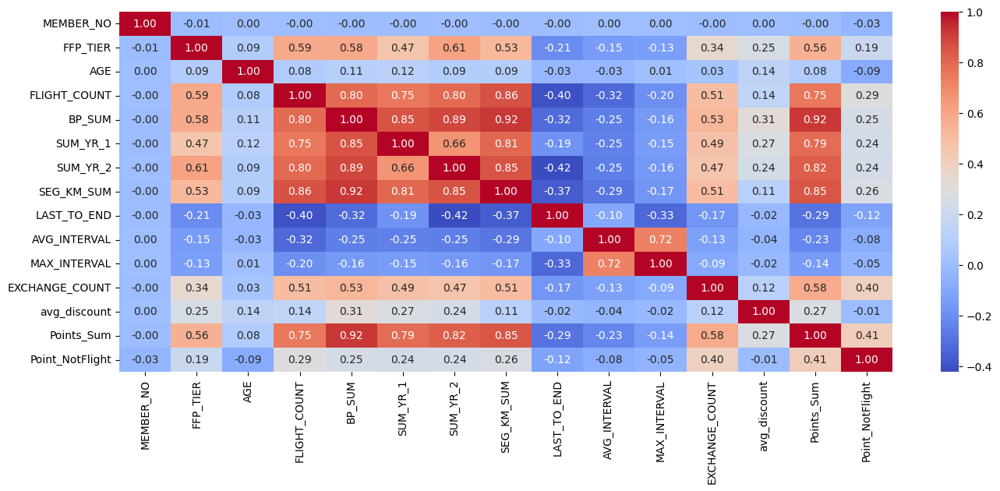

In [ ]:
plt.figure(figsize=(16,6))
sns.heatmap(corr_flight, cmap="coolwarm",annot=True, fmt=".2f")

In [ ]:
sele_features_1 = ['AGE', 'MAX_INTERVAL', 'BP_SUM', 'avg_discount', 'SEG_KM_SUM', 'Point_NotFlight']
flight[sele_features_1]

,AGE,MAX_INTERVAL,BP_SUM,avg_discount,SEG_KM_SUM,Point_NotFlight
0,-1.153853,-1.213336,30.313561,1.308393,26.858668,6.304257
2,-0.229504,-1.213336,20.859581,2.900103,12.699883,3.097978
3,2.235428,-0.765958,20.010465,2.010345,12.586615,1.227649
4,0.592140,-0.977446,16.117841,1.357381,13.949649,4.834712
5,2.235428,-0.936775,18.540013,1.341274,13.218220,1.628433
...,...,...,...,...,...,...
62982,-0.743031,-1.359751,-0.677050,-3.915021,-0.641758,-0.375491
62983,-1.770086,-1.327214,-0.677050,-3.915021,-0.771139,2.563598
62984,-0.434915,-0.871702,-0.677050,-3.915021,-0.443062,5.369092
62985,0.078613,-0.009483,-0.677050,-3.915021,-0.701539,-0.375491


## Elbove methode

In [ ]:
k = range(1,20)

In [ ]:
in_value = []
for i in k :
    km = KMeans(n_clusters=i)
    km.fit(flight[sele_features_1])
    in_value.append(km.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

In [ ]:
in_value

[349068.00000000023,
 275568.29600858054,
 238480.30957965925,
 205937.2069657341,
 177592.75141867244,
 158993.7258686907,
 144060.57894926838,
 132769.19207024443,
 125309.4537657089,
 119318.07648823364,
 113584.97105252807,
 108809.2714196954,
 104706.63775518347,
 100801.72308914762,
 97211.10130761573,
 94153.84717306863,
 91501.34830468697,
 89050.89626361837,
 86760.70172345296]

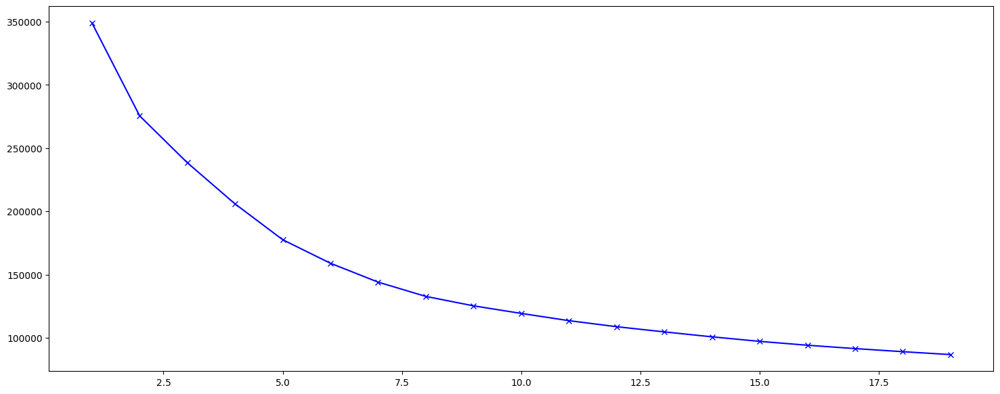

In [ ]:
plt.figure(figsize = (18,7))
plt.plot(k,in_value,'bx-')
plt.show()

In [ ]:
model = KMeans(n_clusters=3)


In [ ]:
model.fit(flight[sele_features_1])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=3)

In [ ]:
flight["Predicted_clusters"] = model.predict(flight[sele_features_1])

In [ ]:
flight

In [ ]:
flight_before_scaling["Predicted_clusters"] = model.predict(flight[sele_features_1])

In [ ]:
flight_before_scaling

In [ ]:
flight.Predicted_clusters.value_counts()

0    31197
1    21899
2     5082
Name: Predicted_clusters, dtype: int64

In [ ]:
sele_features_1

['AGE',
 'MAX_INTERVAL',
 'BP_SUM',
 'avg_discount',
 'SEG_KM_SUM',
 'Point_NotFlight']

In [ ]:
fig = px.scatter(flight,x="AGE",y="SEG_KM_SUM",color="Predicted_clusters")
fig.show()

In [ ]:
fig = px.scatter(flight_before_scaling,x="AGE",y="SEG_KM_SUM",color="Predicted_clusters")
fig.show()

In [ ]:
# PCA Component create
flight[sele_features_1]



,AGE,MAX_INTERVAL,BP_SUM,avg_discount,SEG_KM_SUM,Point_NotFlight
0,-1.153853,-1.213336,30.313561,1.308393,26.858668,6.304257
2,-0.229504,-1.213336,20.859581,2.900103,12.699883,3.097978
3,2.235428,-0.765958,20.010465,2.010345,12.586615,1.227649
4,0.592140,-0.977446,16.117841,1.357381,13.949649,4.834712
5,2.235428,-0.936775,18.540013,1.341274,13.218220,1.628433
...,...,...,...,...,...,...
62982,-0.743031,-1.359751,-0.677050,-3.915021,-0.641758,-0.375491
62983,-1.770086,-1.327214,-0.677050,-3.915021,-0.771139,2.563598
62984,-0.434915,-0.871702,-0.677050,-3.915021,-0.443062,5.369092
62985,0.078613,-0.009483,-0.677050,-3.915021,-0.701539,-0.375491


In [ ]:
pca = PCA(n_components=4)

In [ ]:
pca_flight = pca.fit_transform(flight[sele_features_1])

In [ ]:
pca_flight

array([[38.66368747,  5.08551434,  4.25235363, -2.91921537],
       [23.27288764,  0.9931838 ,  2.08247131,  0.18475926],
       [22.12799384, -1.15860465,  1.60769163, -1.9621718 ],
       ...,
       [-0.11203952,  5.1834119 ,  0.58340505, -2.82705726],
       [-1.93704925,  1.78676902, -0.58612185, -2.7859454 ],
       [-1.74275521,  2.46900613, -1.71741138, -2.23453595]])

In [ ]:
flight_for_pca = flight.copy()

In [ ]:
flight_for_pca["comp-1"] = pca_flight[:,0]
flight_for_pca["comp-2"] = pca_flight[:,1]
flight_for_pca["comp-3"] = pca_flight[:,2]

In [ ]:
flight_before_scaling["comp-1"] = pca_flight[:,0]
flight_before_scaling["comp-2"] = pca_flight[:,1]
flight_before_scaling["comp-3"] = pca_flight[:,2]

In [ ]:
flight_for_pca

In [ ]:
flight_before_scaling.columns

Index(['MEMBER_NO', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'GENDER', 'FFP_TIER',
       'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'AGE', 'LOAD_TIME',
       'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM',
       'LAST_FLIGHT_DATE', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight',
       'predicted_clusters', 'Predicted_clusters', 'comp-1', 'comp-2',
       'comp-3'],
      dtype='object')

In [ ]:
flight_before_scaling

fig = px.scatter_3d(flight_before_scaling,
                    x="comp-1", y="comp-2", z="comp-3",
                    color="Predicted_clusters",
                    size=flight_before_scaling["AGE"],
                    hover_data = ['MEMBER_NO', 'WORK_CITY', 'AGE', 'SEG_KM_SUM', 'GENDER', 'WORK_COUNTRY']

                    )

fig.show()